In [1]:
import matplotlib as mpl
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from mpl_toolkits.basemap import Basemap

In [2]:
pharmacy_full = pd.read_csv('pharmacy_address_indep.csv')
# pharmacy_full.head()

In [3]:
pharmacy_crop = pharmacy_full.drop(pharmacy_full[[0,2,3,4,5,6,8]],axis=1)
# pharmacy_crop.head()

In [4]:
import sys
import time
import requests
import json

In [5]:
postcodes = pharmacy_crop['Postcode']
query_codes = postcodes.tolist()

max_postcodes = 100
number_queries = np.ceil(float(len(query_codes))/max_postcodes)
print ('%d postcodes, requiring %d requests'% (len(query_codes),number_queries))

url = 'http://api.postcodes.io/postcodes'
headers = {'content-type':'application/json'}

lats = []
longs = []

for iquery in range(int(number_queries)):
    min_query = iquery*max_postcodes
    max_query = min((iquery+1)*max_postcodes, len(query_codes))
    
    payload = {'postcodes': query_codes[min_query:max_query]}
    r = requests.post(url, data = json.dumps(payload), headers = headers)
    
    time.sleep(0.1)
    if r.status_code is 200:
        return_data = r.json()
        sys.stdout.write('.')
    else:
        print ('Query failed, status: %d' % r.status_code)
        
    result = return_data['result']
    lats += [result[idx]['result']['latitude'] if result[idx]['result'] is not None else np.nan for idx in range(len(result))]
    longs += [result[idx]['result']['longitude'] if result[idx]['result'] is not None else np.nan for idx in range(len(result))]
    
print ('finished lat long queries')

7460 postcodes, requiring 75 requests
...........................................................................finished lat long queries


/Users/tiannanhao/anaconda/lib/python2.7/site-packages/mpl_toolkits/basemap/__init__.py:3296: MatplotlibDeprecationWarning: The ishold function was deprecated in version 2.0.
  b = ax.ishold()
/Users/tiannanhao/anaconda/lib/python2.7/site-packages/mpl_toolkits/basemap/__init__.py:3305: MatplotlibDeprecationWarning: axes.hold is deprecated.
    See the API Changes document (http://matplotlib.org/api/api_changes.html)
    for more details.
  ax.hold(b)
/Users/tiannanhao/anaconda/lib/python2.7/site-packages/mpl_toolkits/basemap/__init__.py:3222: MatplotlibDeprecationWarning: The ishold function was deprecated in version 2.0.
  b = ax.ishold()
/Users/tiannanhao/anaconda/lib/python2.7/site-packages/mpl_toolkits/basemap/__init__.py:3231: MatplotlibDeprecationWarning: axes.hold is deprecated.
    See the API Changes document (http://matplotlib.org/api/api_changes.html)
    for more details.
  ax.hold(b)


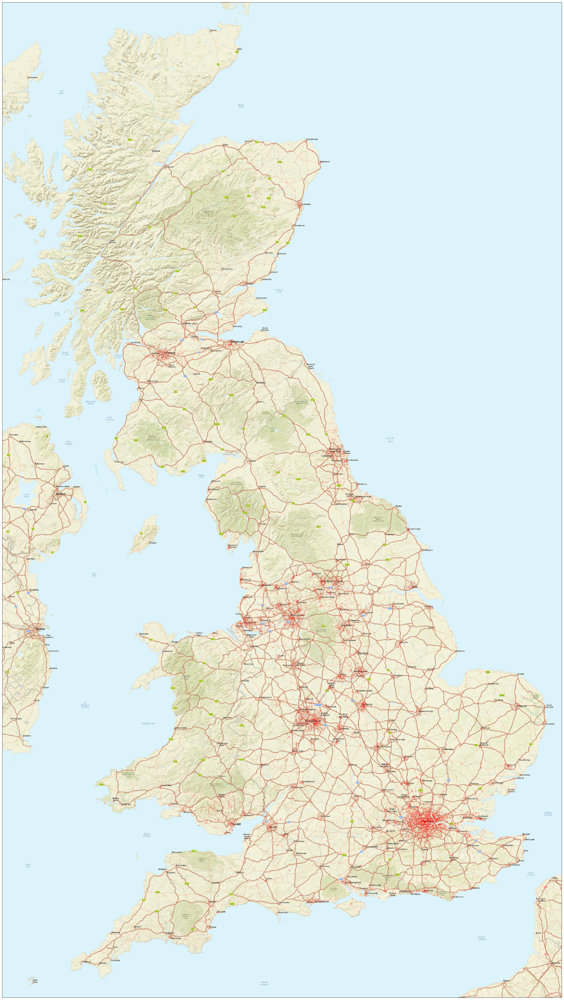

In [7]:
#plotting pharmacy addresses on GB map
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')
import warnings
warnings.simplefilter(action="ignore",category=FutureWarning)

top_right_lat = 58.832069
botton_left_lat = 49.767981
bottom_left_lon = -6.784492
top_right_lon = 2.0
map = Basemap (urcrnrlat = top_right_lat,
               urcrnrlon = bottom_left_lon,
               llcrnrlat = botton_left_lat,
               llcrnrlon = top_right_lon,
               epsg = 3857)
width = 50
height = 70
adj = top_right_lon + bottom_left_lon

adj_longs = [adj-longs for longs in longs]
x, y = map(adj_longs, lats)

fig = plt.gcf()
fig.set_size_inches(width,height);

dpi = 800
xpixels = dpi * width

# http://server.arcgisonline.com/ArcGIS/rest/services
map.arcgisimage(service='World_Street_Map', xpixels=xpixels) 
map.scatter (x, y, c = 'r', alpha = 0.20, marker = 's', s=20, linewidths = 0)

plt.show();